In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import lasio

data=lasio.read('KG-17_wireline_data_final_spliced.las')

C:\Users\malay\anaconda3\Lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
well=data.df()

In [3]:
well.describe()

,BS,CALI,DEPRES,DRHO,DTCO,DTSM,HCGR,HSGR,MEDRES,NEUTRON,PEFZ,RHOZ,SHALORES
count,33472.000000,32987.000000,32961.000000,32987.000000,33136.000000,32693.000000,11091.000000,32957.000000,32961.000000,32955.000000,31820.000000,32987.000000,32961.000000
mean,12.841465,14.022074,3.544507,0.010487,104.487444,217.211880,112.323907,104.771438,12.708078,0.309606,5.958183,2.430661,23.408846
std,3.627995,3.953852,21.960710,0.030800,24.370963,87.626822,37.416497,36.258674,123.392285,0.141034,4.426191,0.205290,190.940906
min,8.500000,1.971600,0.140600,-0.418800,43.560900,-79.806340,10.660600,26.190400,0.150024,-0.008400,1.861800,1.750400,0.172300
25%,8.500000,10.450050,1.315500,-0.005400,87.133000,161.071400,92.281000,70.690000,1.306839,0.204300,4.206601,2.319250,1.033700
50%,12.250000,13.447100,1.630800,-0.000900,99.235200,194.041900,115.104500,107.573200,1.614200,0.254900,5.037260,2.503800,1.618048
75%,17.500000,18.063175,2.796900,0.020400,120.194775,253.173300,136.904800,125.270500,2.695000,0.453900,6.035250,2.574000,2.266200
max,17.500000,24.774100,1950.000000,0.247980,172.644300,521.034800,383.318800,396.931200,1950.000000,0.697400,40.000000,3.063200,1950.000000


In [4]:
well.reset_index(inplace=True)

In [5]:
well.describe()

,DEPTH,BS,CALI,DEPRES,DRHO,DTCO,DTSM,HCGR,HSGR,MEDRES,NEUTRON,PEFZ,RHOZ,SHALORES
count,36753.000000,33472.000000,32987.000000,32961.000000,32987.000000,33136.000000,32693.000000,11091.000000,32957.000000,32961.000000,32955.000000,31820.000000,32987.000000,32961.000000
mean,2800.502400,12.841465,14.022074,3.544507,0.010487,104.487444,217.211880,112.323907,104.771438,12.708078,0.309606,5.958183,2.430661,23.408846
std,1616.936805,3.627995,3.953852,21.960710,0.030800,24.370963,87.626822,37.416497,36.258674,123.392285,0.141034,4.426191,0.205290,190.940906
min,0.000000,8.500000,1.971600,0.140600,-0.418800,43.560900,-79.806340,10.660600,26.190400,0.150024,-0.008400,1.861800,1.750400,0.172300
25%,1400.251200,8.500000,10.450050,1.315500,-0.005400,87.133000,161.071400,92.281000,70.690000,1.306839,0.204300,4.206601,2.319250,1.033700
50%,2800.502400,12.250000,13.447100,1.630800,-0.000900,99.235200,194.041900,115.104500,107.573200,1.614200,0.254900,5.037260,2.503800,1.618048
75%,4200.753600,17.500000,18.063175,2.796900,0.020400,120.194775,253.173300,136.904800,125.270500,2.695000,0.453900,6.035250,2.574000,2.266200
max,5601.004800,17.500000,24.774100,1950.000000,0.247980,172.644300,521.034800,383.318800,396.931200,1950.000000,0.697400,40.000000,3.063200,1950.000000


In [6]:
well['Vp'] = (1.0 / well['DTCO'] )*304800.0
well['Vs'] = (1.0 / well['DTSM'])*304800.0
well['vp/vs']=well['Vp']/well['Vs']
well['AI(Vp)']=well['RHOZ']*well['Vp']
well['AI(vs)']=well['RHOZ']*well['Vs']
well['PR']=(((well['Vp']/well['Vs'])**2)-2)/(2*((well['Vp']/well['Vs'])**2-1))
well['mu(rho)']=(well['RHOZ']*well['Vs'])**2
well['lamda(rho)']=((well['Vp']**2)-2*(well['Vs']**2))*well['RHOZ']

# log plot

In [7]:
import matplotlib.pyplot as plt

# # Define reservoir conditions
# gr_threshold = 50  # Gamma Ray threshold for reservoir
# rhoz_threshold = 2.2 # density threshold for reservoir
# # neutron_threshold=0.2
# medres_threshold = 30  # Medium Resistivity threshold for hydrocarbon presence
# depres_threshold = 100  # Deep Resistivity threshold for hydrocarbon potential

# Initialize Reservoir column with 0
# well['Reservoir'] = 0

# Identify reservoir intervals based on conditions
# reservoir_intervals = []
# in_reservoir = False
# start_depth = None

# for index, row in well.iterrows():
  
#     if row['DEPRES'] > depres_threshold:
#         if not in_reservoir:
#             # Start of a new reservoir interval
#             start_depth = row['DEPTH']
#             in_reservoir = True
#     else:
#         if in_reservoir:
#             # End of the current reservoir interval
#             end_depth = row['DEPTH']
#             reservoir_intervals.append((start_depth, end_depth))
#             well.loc[(well['DEPTH'] >= start_depth) & (well['DEPTH'] <= end_depth), 'Reservoir'] = 1
#             in_reservoir = False

# Handle the case where the last interval goes until the end of the data
# if in_reservoir:
#     end_depth = well['DEPTH'].iloc[-1]
#     reservoir_intervals.append((start_depth, end_depth))
#     well.loc[(well['DEPT

In [8]:
# # Define reservoir conditions based on the provided minimum values
# gr_threshold = 50  # HCGR threshold for hydrocarbon zones
# # rhoz_threshold = 2.2  # Density threshold for porous rock potential
# neutron_threshold = 0.2  # Neutron threshold for reservoir presence
# # medres_threshold = 30  # Medium Resistivity threshold for hydrocarbon presence
# depres_threshold = 100  # Deep Resistivity threshold for hydrocarbon potential

# # Initialize Reservoir column with 0
# well['Reservoir'] = 0

# # Identify reservoir intervals based on the conditions
# reservoir_intervals = []
# in_reservoir = False
# start_depth = None

# for index, row in well.iterrows():
#     if (row['HCGR'] < gr_threshold or
#         row['RHOZ'] < rhoz_threshold or
# #         row['NEUTRON'] > neutron_threshold or
# #         row['MEDRES'] > medres_threshold or
#         row['DEPRES'] > depres_threshold):
#         if not in_reservoir:
#             # Start of a new reservoir interval
#             start_depth = row['DEPTH']
#             in_reservoir = True
#     else:
#         if in_reservoir:
#             # End of the current reservoir interval
#             end_depth = row['DEPTH']
#             reservoir_intervals.append((start_depth, end_depth))
#             well.loc[(well['DEPTH'] >= start_depth) & (well['DEPTH'] <= end_depth), 'Reservoir'] = 1
#             in_reservoir = False

# # Handle the case where the last interval goes until the end of the data
# if in_reservoir:
#     end_depth = well['DEPTH'].iloc[-1]
#     reservoir_intervals.append((start_depth, end_depth))
#     well.loc[(well['DEPTH'] >= start_depth) & (well['DEPTH'] <= end_depth), 'Reservoir'] = 1


In [9]:
reservoir_intervals = [
    (5050, 5400),  # Reservoir interval 1
    (1050, 1440),
    (4050,4350),
    (2600,2750),
    (3450,3600),
    (4500,4550)# Reservoir interval 2
]

# Add a new column to mark reservoir intervals
well['Reservoir'] = 0  # Initialize with 0 or NaN
for start, end in reservoir_intervals:
    well.loc[(well['DEPTH'] >= start) & (well['DEPTH'] <= end), 'Reservoir'] = 1


C:\Users\malay\AppData\Local\Temp\ipykernel_20364\4121355421.py:16: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((1, 7), (0, 0), rowspan=1, colspan=1)


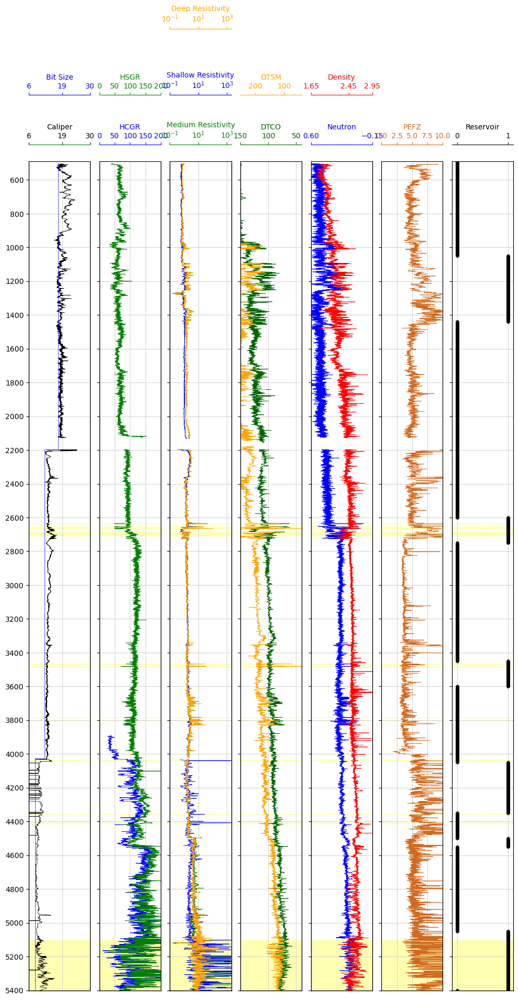

In [10]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


reservoir_intervals = [(5400, 5100),(2633,2637),(2652,2657),
                       (2663,2667),(2685,2710),(3466,3468),(3481,3483),
                       (3783,3784),(3802,3804),(3827,3828),(4037,4042),(4357,4358),(4406,4411)]  # Example reservoir intervals

# Create a figure and set of subplots
fig, ax = plt.subplots(figsize=(10, 19))

# Set up the plot axes
ax1 = plt.subplot2grid((1, 7), (0, 0), rowspan=1, colspan=1)
ax2 = plt.subplot2grid((1, 7), (0, 1), rowspan=1, colspan=1, sharey=ax1)
ax3 = plt.subplot2grid((1, 7), (0, 2), rowspan=1, colspan=1, sharey=ax1)
ax4 = plt.subplot2grid((1, 7), (0, 3), rowspan=1, colspan=1, sharey=ax1)
ax5 = plt.subplot2grid((1, 7), (0, 4), rowspan=1, colspan=1, sharey=ax1)
ax6 = plt.subplot2grid((1, 7), (0, 5), rowspan=1, colspan=1, sharey=ax1)
ax7 = plt.subplot2grid((1, 7), (0, 6), rowspan=1, colspan=1, sharey=ax1)

# Adding top border back in without dealing with splines
for ax in [ax1, ax2, ax3, ax4, ax5, ax6, ax7]:
    twin_ax = ax.twiny()
    twin_ax.xaxis.set_visible(False)

c = ["black", "green", "blue", "red", "yellow", "pink", "chocolate", "lightblue"]

# Combine Caliper and Bit Size track
ax1.plot(well["CALI"], well["DEPTH"], color=c[0], linewidth=0.5)
ax1.set_xlabel("Caliper")
ax1.set_xlim(6, 30)
ax1.xaxis.label.set_color(c[0])        #for label text
ax1.tick_params(axis='x', colors=c[0])   #for scale text
ax1.spines["top"].set_edgecolor(c[1])   #for scale line
ax1.set_xticks([6, 19, 30])

ax1_bs = ax1.twiny()  # Create a second x-axis for the Bit Size track
ax1_bs.plot(well["BS"], well["DEPTH"], color="blue", linewidth=0.5)
ax1_bs.set_xlabel("Bit Size")
ax1_bs.set_xlim(6, 30)
ax1_bs.xaxis.label.set_color("blue")
ax1_bs.tick_params(axis='x', colors="blue")
ax1_bs.spines["top"].set_position(("axes", 1.08))
ax1_bs.spines["top"].set_visible(True)
ax1_bs.spines["top"].set_edgecolor("blue")
ax1_bs.set_xticks([6, 19, 30])

# HCGR track
ax2.plot(well["HCGR"], well["DEPTH"], color="blue", linewidth=0.5)
ax2.set_xlabel("HCGR")
ax2.set_xlim(0, 200)
ax2.xaxis.label.set_color("blue")
ax2.tick_params(axis='x', colors="blue")
ax2.spines["top"].set_edgecolor("blue")
ax2.set_xticks([0, 50, 100, 150, 200])

# Combine HCGR and HSGR track
ax2_hsgr = ax2.twiny()  # Create a second x-axis for the HSGR track
ax2_hsgr.plot(well["HSGR"], well["DEPTH"], color=c[1], linewidth=0.5)
ax2_hsgr.set_xlabel("HSGR")
ax2_hsgr.set_xlim(0, 200)
ax2_hsgr.xaxis.label.set_color(c[1])
ax2_hsgr.tick_params(axis='x', colors=c[1])
ax2_hsgr.spines["top"].set_position(("axes", 1.08))
ax2_hsgr.spines["top"].set_visible(True)
ax2_hsgr.spines["top"].set_edgecolor(c[1])
ax2_hsgr.set_xticks([0, 50, 100, 150, 200])

# Combine MEDRES, SHALORES, and DEPRES track
ax3.plot(well["MEDRES"], well["DEPTH"], color=c[1], linewidth=0.5)
ax3.set_xlabel("Medium Resistivity")
ax3.set_xlim(0.2, 2000)
ax3.xaxis.label.set_color(c[1])
ax3.tick_params(axis='x', colors=c[1])
ax3.spines["top"].set_edgecolor(c[1])
ax3.set_xticks([0.1, 1, 10, 100, 1000])
ax3.semilogx()

ax3_shalores = ax3.twiny()  # Create a second x-axis for SHALORES
ax3_shalores.plot(well["SHALORES"], well["DEPTH"], color=c[2], linewidth=0.5)
ax3_shalores.set_xlabel("Shallow Resistivity")
ax3_shalores.set_xlim(0.2, 2000)
ax3_shalores.xaxis.label.set_color(c[2])
ax3_shalores.tick_params(axis='x', colors=c[2])
ax3_shalores.spines["top"].set_position(("axes", 1.08))
ax3_shalores.spines["top"].set_visible(True)
ax3_shalores.spines["top"].set_edgecolor(c[2])
ax3_shalores.set_xticks([0.1, 1, 10, 100, 1000])
ax3_shalores.semilogx()

ax3_depres = ax3.twiny()  # Create a third x-axis for DEPRES
ax3_depres.plot(well["DEPRES"], well["DEPTH"], color="orange", linewidth=0.5)
ax3_depres.set_xlabel("Deep Resistivity")
ax3_depres.set_xlim(0.2, 2000)
ax3_depres.xaxis.label.set_color("orange")
ax3_depres.tick_params(axis='x', colors="orange")
ax3_depres.spines["top"].set_position(("axes", 1.16))
ax3_depres.spines["top"].set_visible(True)
ax3_depres.spines["top"].set_edgecolor("orange")
ax3_depres.set_xticks([0.1, 1, 10, 100, 1000])
ax3_depres.semilogx()

# Combine DTCO and DTSM track
ax4.plot(well["DTCO"], well["DEPTH"], color='darkgreen', linewidth=0.5)
ax4.set_xlabel("DTCO")
ax4.set_xlim(150, 40)
ax4.xaxis.label.set_color('darkgreen')
ax4.tick_params(axis='x', colors='darkgreen')
ax4.spines["top"].set_edgecolor('darkgreen')

ax4_dtsm = ax4.twiny()  # Create a second x-axis for the DTSM track
ax4_dtsm.plot(well["DTSM"], well["DEPTH"], color="orange", linewidth=0.5)
ax4_dtsm.set_xlabel("DTSM")
ax4_dtsm.set_xlim(250, 40)
ax4_dtsm.xaxis.label.set_color("orange")
ax4_dtsm.tick_params(axis='x', colors="orange")
ax4_dtsm.spines["top"].set_position(("axes", 1.08))
ax4_dtsm.spines["top"].set_visible(True)
ax4_dtsm.spines["top"].set_edgecolor("orange")

# Combine Neutron and Density track
ax5.plot(well["NEUTRON"], well["DEPTH"], color="blue", linewidth=0.5)
ax5.set_xlabel("Neutron")
ax5.set_xlim(0.6, -0.15)
ax5.xaxis.label.set_color("blue")
ax5.tick_params(axis='x', colors="blue")
ax5.spines["top"].set_edgecolor("blue")
ax5.set_xticks([0.6, -0.15])

ax5_rhoz = ax5.twiny()  # Create a second x-axis for the Density track
ax5_rhoz.plot(well["RHOZ"], well["DEPTH"], color="red", linewidth=0.5)
ax5_rhoz.set_xlabel("Density")
ax5_rhoz.set_xlim(1.65, 2.95)
ax5_rhoz.xaxis.label.set_color("red")
ax5_rhoz.tick_params(axis='x', colors="red")
ax5_rhoz.spines["top"].set_position(("axes", 1.08))
ax5_rhoz.spines["top"].set_visible(True)
ax5_rhoz.spines["top"].set_edgecolor("red")
ax5_rhoz.set_xticks([1.65, 2.45, 2.95])

# PEFZ track
ax6.plot(well["PEFZ"], well["DEPTH"], color='chocolate', linewidth=0.5)
ax6.set_xlabel("PEFZ")
ax6.set_xlim(0, 10)
ax6.xaxis.label.set_color('chocolate')
ax6.tick_params(axis='x', colors='chocolate')
ax6.spines["top"].set_edgecolor('chocolate')
ax6.set_xticks([0, 2.5, 5, 7.5, 10])

# Reservoir marker track
ax7.plot(well['Reservoir'], well['DEPTH'], color='black', linewidth=1, marker='o', markersize=3, linestyle='None')
ax7.set_xlabel("Reservoir")
ax7.set_xlim(-0.1, 1.1)
ax7.xaxis.label.set_color('black')
ax7.tick_params(axis='x', colors='black')
ax7.spines["top"].set_edgecolor('black')
ax7.set_xticks([0, 1])

# Add reservoir intervals to the marker track
for start, end in reservoir_intervals:
    ax7.axhspan(end, start, color='yellow', alpha=0.3, linestyle='--', linewidth=0.5)  # Highlighting on Reservoir track

# Add reservoir intervals to the plot for all other tracks
for start, end in reservoir_intervals:
    ax1.axhspan(end, start, color='yellow', alpha=0.3, linestyle='--', linewidth=0.5)  # Highlighting on Caliper track
    ax2.axhspan(end, start, color='yellow', alpha=0.3, linestyle='--', linewidth=0.5)  # Highlighting on HCGR track
    ax3.axhspan(end, start, color='yellow', alpha=0.3, linestyle='--', linewidth=0.5)  # Highlighting on Resistivity tracks
    ax4.axhspan(end, start, color='yellow', alpha=0.3, linestyle='--', linewidth=0.5)  # Highlighting on DTCO track
    ax5.axhspan(end, start, color='yellow', alpha=0.3, linestyle='--', linewidth=0.5)  # Highlighting on Neutron track
    ax6.axhspan(end, start, color='yellow', alpha=0.3, linestyle='--', linewidth=0.5)  # Highlighting on PEFZ track

# Set common properties for all axes
for ax in [ax1, ax2, ax3, ax4, ax5, ax6, ax7]:
    ax.set_ylim(5400,490)
    ax.grid(which='major', color='lightgrey', linestyle='-')
    ax.xaxis.set_ticks_position("top")
    ax.xaxis.set_label_position("top")
    ax.spines["top"].set_position(("axes", 1.02))

# Hide y-tick labels for all but the first track
for ax in [ax2, ax3, ax4, ax5, ax6, ax7]:
    plt.setp(ax.get_yticklabels(), visible=False)

# Set y-ticks every 100 meters
def set_y_ticks(ax):
    ylims = ax.get_ylim()
    interval = 5 if (ylims[0] - ylims[1]) < 1000 else 200
    y_ticks = range(int(ylims[0]), int(ylims[1]), -interval)
    ax.set_yticks(y_ticks)
    ax.set_yticklabels([f'{tick}' for tick in y_ticks])

for ax in [ax1, ax2, ax3, ax4, ax5, ax6, ax7]:
    set_y_ticks(ax)

# Add the zoom callback
def on_zoom(event):
    for ax in [ax1, ax2, ax3, ax4, ax5, ax6, ax7]:
        set_y_ticks(ax)
    plt.draw()

# Connect the zoom event to the callback
fig.canvas.mpl_connect('scroll_event', on_zoom)

plt.tight_layout()
fig.subplots_adjust(wspace=0.15)
plt.show()


In [11]:
filtered_600to2000 = well[(well['DEPTH'] >= 600) & (well['DEPTH'] <= 2000)]
filtered_2000to3500 = well[(well['DEPTH'] >=2000) & (well['DEPTH'] <=3500)]
filtered_3500to5000= well[(well['DEPTH']>=3500) & (well['DEPTH'] <=5000)]


# crossplot  W.R.T depth

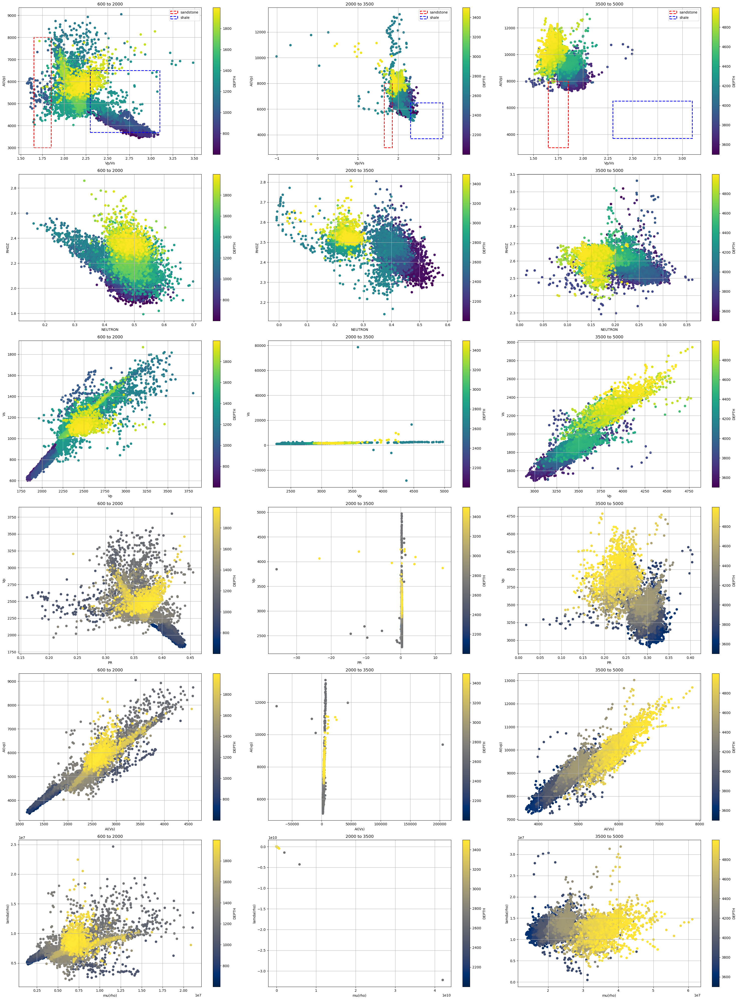

In [12]:

import pandas as pd
from matplotlib.patches import Patch

# Assuming filtered_600to2000, filtered_2000to3500, and filtered_3500to5000 are your filtered dataframes

# Create a list of depth intervals and corresponding filtered dataframes
depth_intervals = [(600, 2000, filtered_600to2000), 
                   (2000, 3500, filtered_2000to3500), 
                   (3500, 5000, filtered_3500to5000)]

fig, axes = plt.subplots(6, 3, figsize=(30,40))  # 2 rows, 3 columns for subplots

# First row of subplots (Vp vs Vs)
for idx, (depth_start, depth_end, filtered_df) in enumerate(depth_intervals):
    ax = axes[0, idx]
    sc = ax.scatter(x="vp/vs", y="AI(Vp)", data=filtered_df, c='DEPTH', cmap='viridis')
    cbar = fig.colorbar(sc, ax=ax, orientation='vertical', pad=0.05)
    cbar.set_label('DEPTH')
    ax.set_title(f'{depth_start} to {depth_end}')
    ax.set_xlabel("Vp/Vs")
    ax.set_ylabel("AI(Vp)")
    ax.grid(True)
    
    # Define two marks for this subplot
    marks = [
        {'vp_vs_range': (1.65, 1.85), 'ai_range': (3000,8000), 'label': 'sandstone', 'color': 'red'},
        {'vp_vs_range': (2.3,3.1), 'ai_range': (3700,6500), 'label': 'shale', 'color': 'blue'}
    ]

     # Add rectangles and legend for marks
    legend_patches = []
    for mark in marks:
        vp_vs_range = mark['vp_vs_range']
        ai_range = mark['ai_range']
        label = mark['label']
        color = mark['color']
        
        # Add the rectangle
        rect = plt.Rectangle(
            (vp_vs_range[0], ai_range[0]),  # Bottom-left corner
            vp_vs_range[1] - vp_vs_range[0],  # Width
            ai_range[1] - ai_range[0],  # Height
            fill=False, edgecolor=color, linewidth=2, linestyle='--'
        )
        ax.add_patch(rect)
        
        # Add the patch to the legend list
        legend_patches.append(Patch(edgecolor=color, facecolor='none', label=label, linewidth=2, linestyle='--'))
    
    # Add legend to the subplot
    ax.legend(handles=legend_patches, loc='upper right')

    
for idx, (depth_start, depth_end, filtered_df) in enumerate(depth_intervals):
    ax = axes[1, idx]
    sc = ax.scatter(x= "NEUTRON", y= "RHOZ", data=filtered_df, c='DEPTH', cmap='viridis')
    cbar = fig.colorbar(sc, ax=ax, orientation='vertical', pad=0.05)
    cbar.set_label('DEPTH')
    ax.set_title(f'{depth_start} to {depth_end}')
    ax.set_xlabel("NEUTRON")
    ax.set_ylabel("RHOZ")
    ax.grid(True)
    
    
for idx, (depth_start, depth_end, filtered_df) in enumerate(depth_intervals):
    ax = axes[2, idx]
    sc = ax.scatter(x="Vp", y="Vs", data=filtered_df, c='DEPTH', cmap='viridis')
    cbar = fig.colorbar(sc, ax=ax, orientation='vertical', pad=0.05)
    cbar.set_label('DEPTH')
    ax.set_title(f'{depth_start} to {depth_end}')
    ax.set_xlabel("Vp")
    ax.set_ylabel("Vs")
    ax.grid(True)    

# Second row of subplots (PR vs Vp)
for idx, (depth_start, depth_end, filtered_df) in enumerate(depth_intervals):
    ax = axes[3, idx]
    sc = ax.scatter(x="PR", y="Vp", data=filtered_df, c='DEPTH', cmap='cividis')
    cbar = fig.colorbar(sc, ax=ax, orientation='vertical', pad=0.05)
    cbar.set_label('DEPTH')
    ax.set_title(f'{depth_start} to {depth_end}')
    ax.set_xlabel("PR")
    ax.set_ylabel("Vp")
    ax.grid(True)
    # 3rd row of subplots (AI(VP) VS AI(vs))
for idx, (depth_start, depth_end, filtered_df) in enumerate(depth_intervals):
    ax = axes[4, idx]
    sc = ax.scatter(x="AI(vs)", y="AI(Vp)", data=filtered_df, c='DEPTH', cmap='cividis')
    cbar = fig.colorbar(sc, ax=ax, orientation='vertical', pad=0.05)
    cbar.set_label('DEPTH')
    ax.set_title(f'{depth_start} to {depth_end}')
    ax.set_xlabel("AI(Vs)")
    ax.set_ylabel("AI(vp)")
    ax.grid(True)
# 4th row of subplots (mu(rho) vs lamda(rho))    
for idx, (depth_start, depth_end, filtered_df) in enumerate(depth_intervals):
    ax = axes[5, idx]
    sc = ax.scatter(x="mu(rho)", y="lamda(rho)", data=filtered_df, c='DEPTH', cmap='cividis')
    cbar = fig.colorbar(sc, ax=ax, orientation='vertical', pad=0.05)
    cbar.set_label('DEPTH')
    ax.set_title(f'{depth_start} to {depth_end}')
    ax.set_xlabel("mu(rho)")
    ax.set_ylabel("lamda(rho)")
    ax.grid(True)
    
 # Define two marks for this subplot
#     marks = [
#         {'mu(rho)_range': (), 'lamda(rho)_range': (), 'label': 'sandstone', 'color': 'red'},
#         {'mu(rho)_range': (), 'lamda(rho)_range': (), 'label': 'shale', 'color': 'blue'}
#     ]

#     # Add rectangles and legend for marks
#     legend_patches = []
#     for mark in marks:
#         mu_rho_range = mark['mu(rho)_range']
#         lamda_rho_range = mark['lamda(rho)_range']
#         label = mark['label']
#         color = mark['color']
        
#         # Add the rectangle
#         rect = plt.Rectangle(
#             (mu_rho_range[0], lamda_rho_range[0]),  # Bottom-left corner
#             mu_rho_range[1] - mu_rho_range[0],  # Width
#             lamda_rho_range[1] - lamda_rho_range[0],  # Height
#             fill=False, edgecolor=color, linewidth=2, linestyle='--'
#         )
#         ax.add_patch(rect)
        
#         # Add the patch to the legend list
#         legend_patches.append(Patch(edgecolor=color, facecolor='none', label=label, linewidth=2, linestyle='--'))
    
#     # Add legend to the subplot
#     ax.legend(handles=legend_patches, loc='upper right')



# # Add row titles
# row_titles = ['Depth Range 1', 'Depth Range 2']
# for ax, title in zip(axes[:, 0], row_titles):
#     ax.annotate(title, xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - 5, 0),
#                 xycoords=ax.yaxis.label, textcoords='offset points',
#                 size='large', ha='center', va='center', rotation=90)

plt.tight_layout()
plt.show()


C:\Users\malay\AppData\Local\Temp\ipykernel_20364\1092499072.py:7: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((1,6), (0,0), rowspan=1, colspan=1)


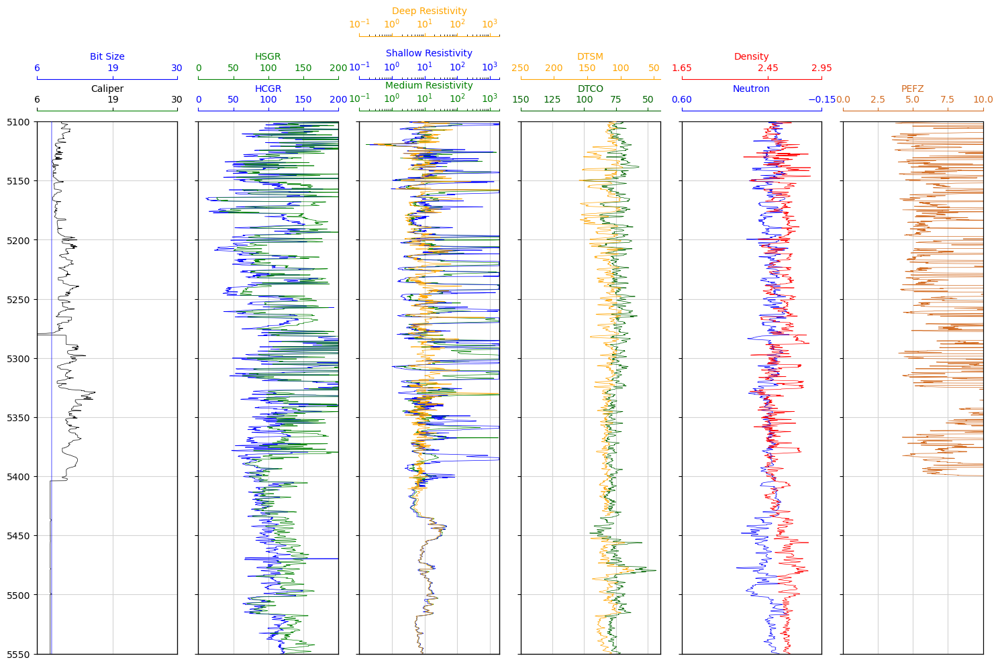

In [13]:
import matplotlib.pyplot as plt

# Create a figure and set of subplots
fig, ax = plt.subplots(figsize=(15,10))

# Set up the plot axes
ax1 = plt.subplot2grid((1,6), (0,0), rowspan=1, colspan=1)
ax2 = plt.subplot2grid((1,6), (0,1), rowspan=1, colspan=1, sharey=ax1)
ax3 = plt.subplot2grid((1,6), (0,2), rowspan=1, colspan=1, sharey=ax1)
ax4 = plt.subplot2grid((1,6), (0,3), rowspan=1, colspan=1, sharey=ax1)
ax5 = plt.subplot2grid((1,6), (0,4), rowspan=1, colspan=1, sharey=ax1)
ax6 = plt.subplot2grid((1,6), (0,5), rowspan=1, colspan=1, sharey=ax1)

# Adding top border back in without dealing with splines
for ax in [ax1, ax2, ax3, ax4, ax5, ax6]:
    twin_ax = ax.twiny()
    twin_ax.xaxis.set_visible(False)

c = ["black", "green", "blue", "red", "yellow", "pink", "chocolate", "lightblue"]

# Combine Caliper and Bit Size track
ax1.plot(well["CALI"], well["DEPTH"], color=c[0], linewidth=0.5)
ax1.set_xlabel("Caliper")
ax1.set_xlim(6, 30)
ax1.xaxis.label.set_color(c[0])        #for label text
ax1.tick_params(axis='x', colors=c[0])   #for scale text
ax1.spines["top"].set_edgecolor(c[1])   #for scale line
ax1.set_xticks([6, 19, 30])

ax1_bs = ax1.twiny()  # Create a second x-axis for the Bit Size track
ax1_bs.plot(well["BS"], well["DEPTH"], color="blue", linewidth=0.5)
ax1_bs.set_xlabel("Bit Size")
ax1_bs.set_xlim(6, 30)
ax1_bs.xaxis.label.set_color("blue")
ax1_bs.tick_params(axis='x', colors="blue")
ax1_bs.spines["top"].set_position(("axes", 1.08))
ax1_bs.spines["top"].set_visible(True)
ax1_bs.spines["top"].set_edgecolor("blue")
ax1_bs.set_xticks([6, 19, 30])

# HCGR track
ax2.plot(well["HCGR"], well["DEPTH"], color="blue", linewidth=0.5)
ax2.set_xlabel("HCGR")
ax2.set_xlim(0, 200)
ax2.xaxis.label.set_color("blue")
ax2.tick_params(axis='x', colors="blue")
ax2.spines["top"].set_edgecolor("blue")
ax2.set_xticks([0, 50, 100, 150, 200])

# Combine HCGR and HSGR track
ax2_hsgr = ax2.twiny()  # Create a second x-axis for the HSGR track
ax2_hsgr.plot(well["HSGR"], well["DEPTH"], color=c[1], linewidth=0.5)
ax2_hsgr.set_xlabel("HSGR")
ax2_hsgr.set_xlim(0, 200)
ax2_hsgr.xaxis.label.set_color(c[1])
ax2_hsgr.tick_params(axis='x', colors=c[1])
ax2_hsgr.spines["top"].set_position(("axes", 1.08))
ax2_hsgr.spines["top"].set_visible(True)
ax2_hsgr.spines["top"].set_edgecolor(c[1])
ax2_hsgr.set_xticks([0, 50, 100, 150, 200])

# Combine MEDRES, SHALORES, and DEPRES track
ax3.plot(well["MEDRES"], well["DEPTH"], color=c[1], linewidth=0.5)
ax3.set_xlabel("Medium Resistivity")
ax3.set_xlim(0.2, 2000)
ax3.xaxis.label.set_color(c[1])
ax3.tick_params(axis='x', colors=c[1])
ax3.spines["top"].set_edgecolor(c[1])
ax3.set_xticks([0.1, 1, 10, 100, 1000])
ax3.semilogx()

ax3_shalores = ax3.twiny()  # Create a second x-axis for SHALORES
ax3_shalores.plot(well["SHALORES"], well["DEPTH"], color=c[2], linewidth=0.5)
ax3_shalores.set_xlabel("Shallow Resistivity")
ax3_shalores.set_xlim(0.2, 2000)
ax3_shalores.xaxis.label.set_color(c[2])
ax3_shalores.tick_params(axis='x', colors=c[2])
ax3_shalores.spines["top"].set_position(("axes", 1.08))
ax3_shalores.spines["top"].set_visible(True)
ax3_shalores.spines["top"].set_edgecolor(c[2])
ax3_shalores.set_xticks([0.1, 1, 10, 100, 1000])
ax3_shalores.semilogx()

ax3_depres = ax3.twiny()  # Create a third x-axis for DEPRES
ax3_depres.plot(well["DEPRES"], well["DEPTH"], color="orange", linewidth=0.5)
ax3_depres.set_xlabel("Deep Resistivity")
ax3_depres.set_xlim(0.2, 2000)
ax3_depres.xaxis.label.set_color("orange")
ax3_depres.tick_params(axis='x', colors="orange")
ax3_depres.spines["top"].set_position(("axes", 1.16))
ax3_depres.spines["top"].set_visible(True)
ax3_depres.spines["top"].set_edgecolor("orange")
ax3_depres.set_xticks([0.1, 1, 10, 100, 1000])
ax3_depres.semilogx()

# Combine DTCO and DTSM track
ax4.plot(well["DTCO"], well["DEPTH"], color='darkgreen', linewidth=0.5)
ax4.set_xlabel("DTCO")
ax4.set_xlim(150,40)
ax4.xaxis.label.set_color('darkgreen')
ax4.tick_params(axis='x', colors='darkgreen')
ax4.spines["top"].set_edgecolor('darkgreen')

ax4_dtsm = ax4.twiny()  # Create a second x-axis for the DTSM track
ax4_dtsm.plot(well["DTSM"], well["DEPTH"], color="orange", linewidth=0.5)
ax4_dtsm.set_xlabel("DTSM")
ax4_dtsm.set_xlim(250,40)
ax4_dtsm.xaxis.label.set_color("orange")
ax4_dtsm.tick_params(axis='x', colors="orange")
ax4_dtsm.spines["top"].set_position(("axes", 1.08))
ax4_dtsm.spines["top"].set_visible(True)
ax4_dtsm.spines["top"].set_edgecolor("orange")

# Combine Neutron and Density track
ax5.plot(well["NEUTRON"], well["DEPTH"], color="blue", linewidth=0.5)
ax5.set_xlabel("Neutron")
ax5.set_xlim(0.6,-0.15)
ax5.xaxis.label.set_color("blue")
ax5.tick_params(axis='x', colors="blue")
ax5.spines["top"].set_edgecolor("blue")
ax5.set_xticks([0.6,-0.15])

ax5_rhoz = ax5.twiny()  # Create a second x-axis for the Density track
ax5_rhoz.plot(well["RHOZ"], well["DEPTH"], color="red", linewidth=0.5)
ax5_rhoz.set_xlabel("Density")
ax5_rhoz.set_xlim(1.65,2.95)
ax5_rhoz.xaxis.label.set_color("red")
ax5_rhoz.tick_params(axis='x', colors="red")
ax5_rhoz.spines["top"].set_position(("axes", 1.08))
ax5_rhoz.spines["top"].set_visible(True)
ax5_rhoz.spines["top"].set_edgecolor("red")
ax5_rhoz.set_xticks([1.65, 2.45, 2.95])

# PEFZ track
ax6.plot(well["PEFZ"], well["DEPTH"], color='chocolate', linewidth=0.5)
ax6.set_xlabel("PEFZ")
ax6.set_xlim(0, 10)
ax6.xaxis.label.set_color('chocolate')
ax6.tick_params(axis='x', colors='chocolate')
ax6.spines["top"].set_edgecolor('chocolate')
ax6.set_xticks([0, 2.5, 5, 7.5, 10])

# Set common properties for all axes
for ax in [ax1, ax2, ax3, ax4, ax5, ax6]:
    ax.set_ylim(5550,5100)
    ax.grid(which='major', color='lightgrey', linestyle='-')
    ax.xaxis.set_ticks_position("top")
    ax.xaxis.set_label_position("top")
    ax.spines["top"].set_position(("axes", 1.02))

# Hide y-tick labels for all but the first track
for ax in [ax2, ax3, ax4, ax5, ax6]:
    plt.setp(ax.get_yticklabels(), visible=False)

plt.tight_layout()
fig.subplots_adjust(wspace=0.15)
plt.show()


C:\Users\malay\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='VSHALE', ylabel='Count'>

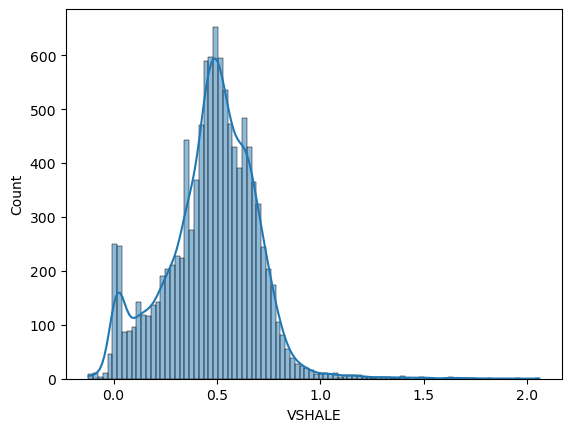

In [14]:
import seaborn as sns
def shale_volume(gamma_ray, gamma_ray_max, gamma_ray_min):
    vshale = (gamma_ray - gamma_ray_min) / (gamma_ray_max - gamma_ray_min)
    return round(vshale, 4)

well['VSHALE'] = shale_volume(well['HCGR'], well['HCGR'].quantile(q=0.99),
                             well['HCGR'].quantile(q=0.01))
sns.histplot(well['VSHALE'],kde=True)

In [15]:
filtered_3500to4000 = well[(well['DEPTH'] >= 3500) & (well['DEPTH'] <= 4000)]
filtered_4000to4500 = well[(well['DEPTH'] >= 4000) & (well['DEPTH'] <= 4500)]
filtered_4500to5000 = well[(well['DEPTH'] >= 4500) & (well['DEPTH'] <= 5000)]
filtered_5000to5500 = well[(well['DEPTH'] >= 5000) & (well['DEPTH'] <= 5500)]

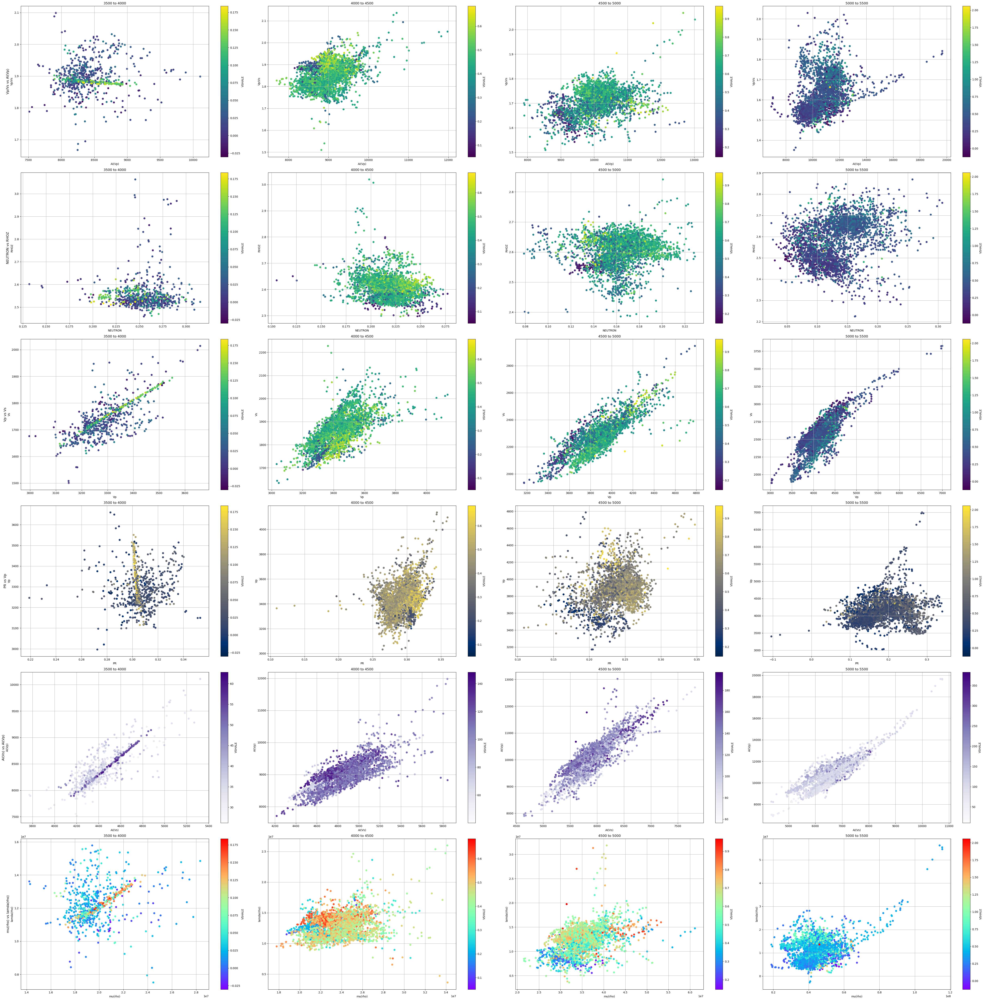

In [16]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.patches import Patch  # Import Patch for the legend

# Assuming filtered_3500to4000, filtered_4000to4500, filtered_4500to5000, and filtered_5000to5500 are your filtered dataframes

# Create a list of depth intervals and corresponding filtered dataframes
depth_intervals = [
    (3500, 4000, filtered_3500to4000), 
    (4000, 4500, filtered_4000to4500), 
    (4500, 5000, filtered_4500to5000),
    (5000, 5500, filtered_5000to5500)
]

fig, axes = plt.subplots(6, 4, figsize=(50, 50))

for idx, (depth_start, depth_end, filtered_df) in enumerate(depth_intervals):
    ax = axes[0, idx]
    sc = ax.scatter(x="AI(Vp)", y="vp/vs", data=filtered_df, c='VSHALE', cmap='viridis')
    cbar = fig.colorbar(sc, ax=ax, orientation='vertical', pad=0.05)
    cbar.set_label('VSHALE')
    ax.set_title(f'{depth_start} to {depth_end}')
    ax.set_xlabel("AI(Vp)")
    ax.set_ylabel("Vp/Vs")
    ax.grid(True)
    
#     # Define two marks for this subplot
#     marks = [
#         {'ai_range': (1.65, 2.3), 'vp_vs_range': (3000, 8000), 'label': 'sandstone', 'color': 'red'},
#         {'ai_range': (2.3, 3.1), 'vp_vs_range': (3700, 6500), 'label': 'shale', 'color': 'blue'}
#     ]

#     # Add rectangles and legend for marks
#     legend_patches = []
#     for mark in marks:
#         ai_range = mark['ai_range']
#         vp_vs_range = mark['vp_vs_range']
#         label = mark['label']
#         color = mark['color']
        
#         # Add the rectangle
#         rect = plt.Rectangle(
#             (vp_vs_range[0], ai_range[0]),  # Bottom-left corner
#             vp_vs_range[1] - vp_vs_range[0],  # Width
#             ai_range[1] - ai_range[0],  # Height
#             fill=False, edgecolor=color, linewidth=2, linestyle='--'
#         )
#         ax.add_patch(rect)
        
#         # Add the patch to the legend list
#         legend_patches.append(Patch(edgecolor=color, facecolor='none', label=label, linewidth=2, linestyle='--'))
    
#     # Add legend to the subplot
#     ax.legend(handles=legend_patches, loc='upper right')

# Second row of subplots (NEUTRON vs RHOZ)
for idx, (depth_start, depth_end, filtered_df) in enumerate(depth_intervals):
    ax = axes[1, idx]
    sc = ax.scatter(x="NEUTRON", y="RHOZ", data=filtered_df, c='VSHALE', cmap='viridis')
    cbar = fig.colorbar(sc, ax=ax, orientation='vertical', pad=0.05)
    cbar.set_label('VSHALE')
    ax.set_title(f'{depth_start} to {depth_end}')
    ax.set_xlabel("NEUTRON")
    ax.set_ylabel("RHOZ")
    ax.grid(True)
    
#     # Define two marks for this subplot
#     marks = [
#         {'NEUTRON_range': (0.1,0.3), 'RHOZ_range': (2.4,2.7), 'label': 'sandstone', 'color': 'red'},
#         {'NEUTRON_range': (0.3,0.5), 'RHOZ_range': (2.6,2.7), 'label': 'shale', 'color': 'blue'},
#         {'NEUTRON_range': (0.1,0.3), 'RHOZ_range': (2.6,2.8), 'label': 'lomestone', 'color': 'black'}
#     ]

#     # Add rectangles and legend for marks
#     legend_patches = []
#     for mark in marks:
#         neutron_range = mark['NEUTRON_range']
#         rhoz_range = mark['RHOZ_range']
#         label = mark['label']
#         color = mark['color']
        
#         # Add the rectangle
#         rect = plt.Rectangle(
#             (neutron_range[0], rhoz_range[0]),  # Bottom-left corner
#             neutron_range[1] - neutron_range[0],  # Width
#             rhoz_range[1] - rhoz_range[0],  # Height
#             fill=False, edgecolor=color, linewidth=2, linestyle='--'
#         )
#         ax.add_patch(rect)
        
#         # Add the patch to the legend list
#         legend_patches.append(Patch(edgecolor=color, facecolor='none', label=label, linewidth=2, linestyle='--'))
    
#     # Add legend to the subplot
#     ax.legend(handles=legend_patches, loc='upper right')

# Third row of subplots (Vp vs Vs)
for idx, (depth_start, depth_end, filtered_df) in enumerate(depth_intervals):
    ax = axes[2, idx]
    sc = ax.scatter(x="Vp", y="Vs", data=filtered_df, c='VSHALE', cmap='viridis')
    cbar = fig.colorbar(sc, ax=ax, orientation='vertical', pad=0.05)
    cbar.set_label('VSHALE')
    ax.set_title(f'{depth_start} to {depth_end}')
    ax.set_xlabel("Vp")
    ax.set_ylabel("Vs")
    ax.grid(True)
    
#     # Define two marks for this subplot
#     marks = [
#         {'vp_range': (), 'vs_range': (), 'label': 'sandstone', 'color': 'red'},
#         {'vp_range': (), 'vs_range': (), 'label': 'shale', 'color': 'blue'}
#     ]

#     # Add rectangles and legend for marks
#     legend_patches = []
#     for mark in marks:
#         vp_range = mark['vp_range']
#         vs_range = mark['vs_range']
#         label = mark['label']
#         color = mark['color']
        
#         # Add the rectangle
#         rect = plt.Rectangle(
#             (vp_range[0], vs_range[0]),  # Bottom-left corner
#             vp_range[1] - vp_range[0],  # Width
#             vs_range[1] - vs_range[0],  # Height
#             fill=False, edgecolor=color, linewidth=2, linestyle='--'
#         )
#         ax.add_patch(rect)
        
#         # Add the patch to the legend list
#         legend_patches.append(Patch(edgecolor=color, facecolor='none', label=label, linewidth=2, linestyle='--'))
    
#     # Add legend to the subplot
#     ax.legend(handles=legend_patches, loc='upper right')

# Fourth row of subplots (PR vs Vp)
for idx, (depth_start, depth_end, filtered_df) in enumerate(depth_intervals):
    ax = axes[3, idx]
    sc = ax.scatter(x="PR", y="Vp", data=filtered_df, c='VSHALE', cmap='cividis')
    cbar = fig.colorbar(sc, ax=ax, orientation='vertical', pad=0.05)
    cbar.set_label('VSHALE')
    ax.set_title(f'{depth_start} to {depth_end}')
    ax.set_xlabel("PR")
    ax.set_ylabel("Vp")
    ax.grid(True)
    
#     # Define two marks for this subplot
#     marks = [
#         {'PR_range': (), 'vp_range': (), 'label': 'sandstone', 'color': 'red'},
#         {'PR_range': (), 'vp_range': (), 'label': 'shale', 'color': 'blue'}
#     ]

#     # Add rectangles and legend for marks
#     legend_patches = []
#     for mark in marks:
#         pr_range = mark['PR_range']
#         vp_range = mark['vp_range']
#         label = mark['label']
#         color = mark['color']
        
#         # Add the rectangle
#         rect = plt.Rectangle(
#             (pr_range[0], vp_range[0]),  # Bottom-left corner
#             pr_range[1] - pr_range[0],  # Width
#             vp_range[1] - vp_range[0],  # Height
#             fill=False, edgecolor=color, linewidth=2, linestyle='--'
#         )
#         ax.add_patch(rect)
        
#         # Add the patch to the legend list
#         legend_patches.append(Patch(edgecolor=color, facecolor='none', label=label, linewidth=2, linestyle='--'))
    
#     # Add legend to the subplot
#     ax.legend(handles=legend_patches, loc='upper right')

# Fifth row of subplots (AI(VP) VS AI(vs))
for idx, (depth_start, depth_end, filtered_df) in enumerate(depth_intervals):
    ax = axes[4, idx]
    sc = ax.scatter(x="AI(vs)", y="AI(Vp)", data=filtered_df, c='HCGR', cmap='Purples')
    cbar = fig.colorbar(sc, ax=ax, orientation='vertical', pad=0.05)
    cbar.set_label('VSHALE')
    ax.set_title(f'{depth_start} to {depth_end}')
    ax.set_xlabel("AI(Vs)")
    ax.set_ylabel("AI(Vp)")
    ax.grid(True)
    
#     # Define two marks for this subplot
#     marks = [
#         {'AI(vs)_range': (), 'AI(Vp)_range': (), 'label': 'sandstone', 'color': 'red'},
#         {'AI(vs)_range': (), 'AI(Vp)_range': (), 'label': 'shale', 'color': 'blue'}
#     ]

#     # Add rectangles and legend for marks
#     legend_patches = []
#     for mark in marks:
#         ai_vs_range = mark['AI(vs)_range']
#         ai_vp_range = mark['AI(Vp)_range']
#         label = mark['label']
#         color = mark['color']
        
#         # Add the rectangle
#         rect = plt.Rectangle(
#             (ai_vs_range[0], ai_vp_range[0]),  # Bottom-left corner
#             ai_vs_range[1] - ai_vs_range[0],  # Width
#             ai_vp_range[1] - ai_vp_range[0],  # Height
#             fill=False, edgecolor=color, linewidth=2, linestyle='--'
#         )
#         ax.add_patch(rect)
        
#         # Add the patch to the legend list
#         legend_patches.append(Patch(edgecolor=color, facecolor='none', label=label, linewidth=2, linestyle='--'))
    
#     # Add legend to the subplot
#     ax.legend(handles=legend_patches, loc='upper right')

# Sixth row of subplots (mu(rho) vs lamda(rho))
for idx, (depth_start, depth_end, filtered_df) in enumerate(depth_intervals):
    ax = axes[5, idx]
    sc = ax.scatter(x="mu(rho)", y="lamda(rho)", data=filtered_df, c='VSHALE', cmap='rainbow')
    cbar = fig.colorbar(sc, ax=ax, orientation='vertical', pad=0.05)
    cbar.set_label('VSHALE')
    ax.set_title(f'{depth_start} to {depth_end}')
    ax.set_xlabel("mu(rho)")
    ax.set_ylabel("lamda(rho)")
    ax.grid(True)
    
#     # Define two marks for this subplot
#     marks = [
#         {'mu(rho)_range': (), 'lamda(rho)_range': (), 'label': 'sandstone', 'color': 'red'},
#         {'mu(rho)_range': (), 'lamda(rho)_range': (), 'label': 'shale', 'color': 'blue'}
#     ]

#     # Add rectangles and legend for marks
#     legend_patches = []
#     for mark in marks:
#         mu_rho_range = mark['mu(rho)_range']
#         lamda_rho_range = mark['lamda(rho)_range']
#         label = mark['label']
#         color = mark['color']
        
#         # Add the rectangle
#         rect = plt.Rectangle(
#             (mu_rho_range[0], lamda_rho_range[0]),  # Bottom-left corner
#             mu_rho_range[1] - mu_rho_range[0],  # Width
#             lamda_rho_range[1] - lamda_rho_range[0],  # Height
#             fill=False, edgecolor=color, linewidth=2, linestyle='--'
#         )
#         ax.add_patch(rect)
        
#         # Add the patch to the legend list
#         legend_patches.append(Patch(edgecolor=color, facecolor='none', label=label, linewidth=2, linestyle='--'))
    
#     # Add legend to the subplot
#     ax.legend(handles=legend_patches, loc='upper right')

# Add row titles
row_titles = ['Vp/Vs vs AI(Vp)', 'NEUTRON vs RHOZ', 'Vp vs Vs', 'PR vs Vp', 'AI(Vs) vs AI(Vp)', 'mu(rho) vs lamda(rho)']
for ax, title in zip(axes[:, 0], row_titles):
    ax.annotate(title, xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - 5, 0),
                xycoords=ax.yaxis.label, textcoords='offset points',
                size='large', ha='center', va='center', rotation=90)

plt.tight_layout()
plt.show()

In [17]:
filtered_5000to5100 = well[(well['DEPTH'] >= 5000) & (well['DEPTH'] <= 5100)]
filtered_5100to5200 = well[(well['DEPTH'] >= 5100) & (well['DEPTH'] <= 5200)]
filtered_5200to5300 = well[(well['DEPTH'] >= 5200) & (well['DEPTH'] <= 5300)]
filtered_5300to5400 = well[(well['DEPTH'] >= 5300) & (well['DEPTH'] <= 5400)]

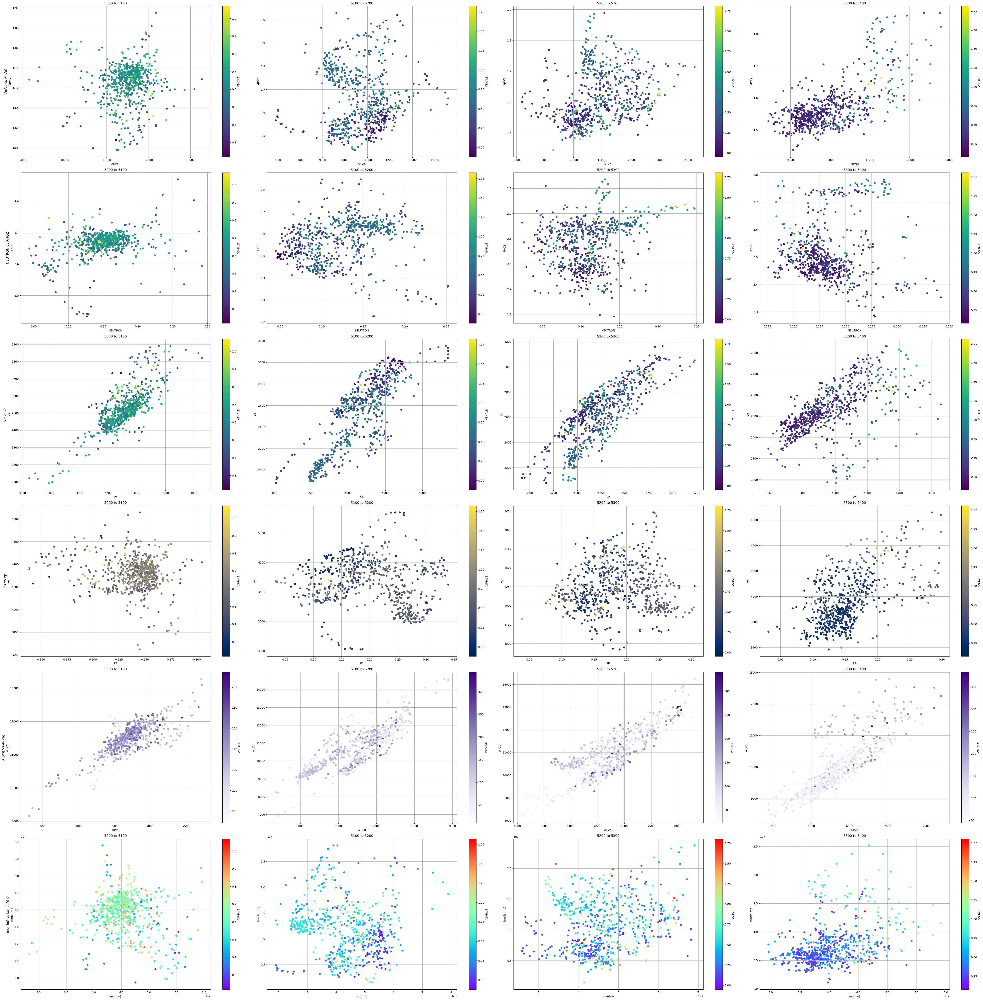

In [18]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.patches import Patch  # Import Patch for the legend

# Assuming filtered_3500to4000, filtered_4000to4500, filtered_4500to5000, and filtered_5000to5500 are your filtered dataframes

# Create a list of depth intervals and corresponding filtered dataframes
depth_intervals = [
    (5000, 5100, filtered_5000to5100), 
    (5100, 5200, filtered_5100to5200), 
    (5200, 5300, filtered_5200to5300),
    (5300, 5400, filtered_5300to5400)
]

fig, axes = plt.subplots(6, 4, figsize=(50, 50))

for idx, (depth_start, depth_end, filtered_df) in enumerate(depth_intervals):
    ax = axes[0, idx]
    sc = ax.scatter(x="AI(Vp)", y="vp/vs", data=filtered_df, c='VSHALE', cmap='viridis')
    cbar = fig.colorbar(sc, ax=ax, orientation='vertical', pad=0.05)
    cbar.set_label('VSHALE')
    ax.set_title(f'{depth_start} to {depth_end}')
    ax.set_xlabel("AI(Vp)")
    ax.set_ylabel("Vp/Vs")
    ax.grid(True)
    
#     # Define two marks for this subplot
#     marks = [
#         {'ai_range': (1.65, 2.3), 'vp_vs_range': (3000, 8000), 'label': 'sandstone', 'color': 'red'},
#         {'ai_range': (2.3, 3.1), 'vp_vs_range': (3700, 6500), 'label': 'shale', 'color': 'blue'}
#     ]

#     # Add rectangles and legend for marks
#     legend_patches = []
#     for mark in marks:
#         ai_range = mark['ai_range']
#         vp_vs_range = mark['vp_vs_range']
#         label = mark['label']
#         color = mark['color']
        
#         # Add the rectangle
#         rect = plt.Rectangle(
#             (vp_vs_range[0], ai_range[0]),  # Bottom-left corner
#             vp_vs_range[1] - vp_vs_range[0],  # Width
#             ai_range[1] - ai_range[0],  # Height
#             fill=False, edgecolor=color, linewidth=2, linestyle='--'
#         )
#         ax.add_patch(rect)
        
#         # Add the patch to the legend list
#         legend_patches.append(Patch(edgecolor=color, facecolor='none', label=label, linewidth=2, linestyle='--'))
    
#     # Add legend to the subplot
#     ax.legend(handles=legend_patches, loc='upper right')

# Second row of subplots (NEUTRON vs RHOZ)
for idx, (depth_start, depth_end, filtered_df) in enumerate(depth_intervals):
    ax = axes[1, idx]
    sc = ax.scatter(x="NEUTRON", y="RHOZ", data=filtered_df, c='VSHALE', cmap='viridis')
    cbar = fig.colorbar(sc, ax=ax, orientation='vertical', pad=0.05)
    cbar.set_label('VSHALE')
    ax.set_title(f'{depth_start} to {depth_end}')
    ax.set_xlabel("NEUTRON")
    ax.set_ylabel("RHOZ")
    ax.grid(True)
    
#     # Define two marks for this subplot
#     marks = [
#         {'NEUTRON_range': (0.1,0.3), 'RHOZ_range': (2.4,2.7), 'label': 'sandstone', 'color': 'red'},
#         {'NEUTRON_range': (0.3,0.5), 'RHOZ_range': (2.6,2.7), 'label': 'shale', 'color': 'blue'},
#         {'NEUTRON_range': (0.1,0.3), 'RHOZ_range': (2.6,2.8), 'label': 'lomestone', 'color': 'black'}
#     ]

#     # Add rectangles and legend for marks
#     legend_patches = []
#     for mark in marks:
#         neutron_range = mark['NEUTRON_range']
#         rhoz_range = mark['RHOZ_range']
#         label = mark['label']
#         color = mark['color']
        
#         # Add the rectangle
#         rect = plt.Rectangle(
#             (neutron_range[0], rhoz_range[0]),  # Bottom-left corner
#             neutron_range[1] - neutron_range[0],  # Width
#             rhoz_range[1] - rhoz_range[0],  # Height
#             fill=False, edgecolor=color, linewidth=2, linestyle='--'
#         )
#         ax.add_patch(rect)
        
#         # Add the patch to the legend list
#         legend_patches.append(Patch(edgecolor=color, facecolor='none', label=label, linewidth=2, linestyle='--'))
    
#     # Add legend to the subplot
#     ax.legend(handles=legend_patches, loc='upper right')

# Third row of subplots (Vp vs Vs)
for idx, (depth_start, depth_end, filtered_df) in enumerate(depth_intervals):
    ax = axes[2, idx]
    sc = ax.scatter(x="Vp", y="Vs", data=filtered_df, c='VSHALE', cmap='viridis')
    cbar = fig.colorbar(sc, ax=ax, orientation='vertical', pad=0.05)
    cbar.set_label('VSHALE')
    ax.set_title(f'{depth_start} to {depth_end}')
    ax.set_xlabel("Vp")
    ax.set_ylabel("Vs")
    ax.grid(True)
    
#     # Define two marks for this subplot
#     marks = [
#         {'vp_range': (), 'vs_range': (), 'label': 'sandstone', 'color': 'red'},
#         {'vp_range': (), 'vs_range': (), 'label': 'shale', 'color': 'blue'}
#     ]

#     # Add rectangles and legend for marks
#     legend_patches = []
#     for mark in marks:
#         vp_range = mark['vp_range']
#         vs_range = mark['vs_range']
#         label = mark['label']
#         color = mark['color']
        
#         # Add the rectangle
#         rect = plt.Rectangle(
#             (vp_range[0], vs_range[0]),  # Bottom-left corner
#             vp_range[1] - vp_range[0],  # Width
#             vs_range[1] - vs_range[0],  # Height
#             fill=False, edgecolor=color, linewidth=2, linestyle='--'
#         )
#         ax.add_patch(rect)
        
#         # Add the patch to the legend list
#         legend_patches.append(Patch(edgecolor=color, facecolor='none', label=label, linewidth=2, linestyle='--'))
    
#     # Add legend to the subplot
#     ax.legend(handles=legend_patches, loc='upper right')

# Fourth row of subplots (PR vs Vp)
for idx, (depth_start, depth_end, filtered_df) in enumerate(depth_intervals):
    ax = axes[3, idx]
    sc = ax.scatter(x="PR", y="Vp", data=filtered_df, c='VSHALE', cmap='cividis')
    cbar = fig.colorbar(sc, ax=ax, orientation='vertical', pad=0.05)
    cbar.set_label('VSHALE')
    ax.set_title(f'{depth_start} to {depth_end}')
    ax.set_xlabel("PR")
    ax.set_ylabel("Vp")
    ax.grid(True)
    
#     # Define two marks for this subplot
#     marks = [
#         {'PR_range': (), 'vp_range': (), 'label': 'sandstone', 'color': 'red'},
#         {'PR_range': (), 'vp_range': (), 'label': 'shale', 'color': 'blue'}
#     ]

#     # Add rectangles and legend for marks
#     legend_patches = []
#     for mark in marks:
#         pr_range = mark['PR_range']
#         vp_range = mark['vp_range']
#         label = mark['label']
#         color = mark['color']
        
#         # Add the rectangle
#         rect = plt.Rectangle(
#             (pr_range[0], vp_range[0]),  # Bottom-left corner
#             pr_range[1] - pr_range[0],  # Width
#             vp_range[1] - vp_range[0],  # Height
#             fill=False, edgecolor=color, linewidth=2, linestyle='--'
#         )
#         ax.add_patch(rect)
        
#         # Add the patch to the legend list
#         legend_patches.append(Patch(edgecolor=color, facecolor='none', label=label, linewidth=2, linestyle='--'))
    
#     # Add legend to the subplot
#     ax.legend(handles=legend_patches, loc='upper right')

# Fifth row of subplots (AI(VP) VS AI(vs))
for idx, (depth_start, depth_end, filtered_df) in enumerate(depth_intervals):
    ax = axes[4, idx]
    sc = ax.scatter(x="AI(vs)", y="AI(Vp)", data=filtered_df, c='HCGR', cmap='Purples')
    cbar = fig.colorbar(sc, ax=ax, orientation='vertical', pad=0.05)
    cbar.set_label('VSHALE')
    ax.set_title(f'{depth_start} to {depth_end}')
    ax.set_xlabel("AI(Vs)")
    ax.set_ylabel("AI(Vp)")
    ax.grid(True)
    
#     # Define two marks for this subplot
#     marks = [
#         {'AI(vs)_range': (), 'AI(Vp)_range': (), 'label': 'sandstone', 'color': 'red'},
#         {'AI(vs)_range': (), 'AI(Vp)_range': (), 'label': 'shale', 'color': 'blue'}
#     ]

#     # Add rectangles and legend for marks
#     legend_patches = []
#     for mark in marks:
#         ai_vs_range = mark['AI(vs)_range']
#         ai_vp_range = mark['AI(Vp)_range']
#         label = mark['label']
#         color = mark['color']
        
#         # Add the rectangle
#         rect = plt.Rectangle(
#             (ai_vs_range[0], ai_vp_range[0]),  # Bottom-left corner
#             ai_vs_range[1] - ai_vs_range[0],  # Width
#             ai_vp_range[1] - ai_vp_range[0],  # Height
#             fill=False, edgecolor=color, linewidth=2, linestyle='--'
#         )
#         ax.add_patch(rect)
        
#         # Add the patch to the legend list
#         legend_patches.append(Patch(edgecolor=color, facecolor='none', label=label, linewidth=2, linestyle='--'))
    
#     # Add legend to the subplot
#     ax.legend(handles=legend_patches, loc='upper right')

# Sixth row of subplots (mu(rho) vs lamda(rho))
for idx, (depth_start, depth_end, filtered_df) in enumerate(depth_intervals):
    ax = axes[5, idx]
    sc = ax.scatter(x="mu(rho)", y="lamda(rho)", data=filtered_df, c='VSHALE', cmap='rainbow')
    cbar = fig.colorbar(sc, ax=ax, orientation='vertical', pad=0.05)
    cbar.set_label('VSHALE')
    ax.set_title(f'{depth_start} to {depth_end}')
    ax.set_xlabel("mu(rho)")
    ax.set_ylabel("lamda(rho)")
    ax.grid(True)
    
#     # Define two marks for this subplot
#     marks = [
#         {'mu(rho)_range': (), 'lamda(rho)_range': (), 'label': 'sandstone', 'color': 'red'},
#         {'mu(rho)_range': (), 'lamda(rho)_range': (), 'label': 'shale', 'color': 'blue'}
#     ]

#     # Add rectangles and legend for marks
#     legend_patches = []
#     for mark in marks:
#         mu_rho_range = mark['mu(rho)_range']
#         lamda_rho_range = mark['lamda(rho)_range']
#         label = mark['label']
#         color = mark['color']
        
#         # Add the rectangle
#         rect = plt.Rectangle(
#             (mu_rho_range[0], lamda_rho_range[0]),  # Bottom-left corner
#             mu_rho_range[1] - mu_rho_range[0],  # Width
#             lamda_rho_range[1] - lamda_rho_range[0],  # Height
#             fill=False, edgecolor=color, linewidth=2, linestyle='--'
#         )
#         ax.add_patch(rect)
        
#         # Add the patch to the legend list
#         legend_patches.append(Patch(edgecolor=color, facecolor='none', label=label, linewidth=2, linestyle='--'))
    
#     # Add legend to the subplot
#     ax.legend(handles=legend_patches, loc='upper right')

# Add row titles
row_titles = ['Vp/Vs vs AI(Vp)', 'NEUTRON vs RHOZ', 'Vp vs Vs', 'PR vs Vp', 'AI(Vs) vs AI(Vp)', 'mu(rho) vs lamda(rho)']
for ax, title in zip(axes[:, 0], row_titles):
    ax.annotate(title, xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - 5, 0),
                xycoords=ax.yaxis.label, textcoords='offset points',
                size='large', ha='center', va='center', rotation=90)

plt.tight_layout()
plt.show()

In [19]:


well['VCLAY']=well['VSHALE']*0.70
well['VQTZ']=well['VSHALE']*0.30


In [20]:
def density_porosity(input_density, matrix_density, fluid_density):
    denpor = (matrix_density - input_density) / (matrix_density - fluid_density)
    return round(denpor, 4)

In [21]:
density_porosity(well['RHOZ'], 2.65, 1)

0           NaN
1           NaN
2           NaN
3           NaN
4           NaN
          ...  
36748    0.0364
36749    0.0364
36750    0.0364
36751       NaN
36752       NaN
Name: RHOZ, Length: 36753, dtype: float64

In [22]:
# Constants for matrix and fluid properties
K_clay = 20  # GPa
K_quartz = 37  # GPa
rho_quartz=2.65
rho_clay=2.58
rho_fluid = 1.0  # g/cm³

# Volume fractions
V_clay = well['VCLAY']
V_quartz = well['VQTZ']

# Voigt and Reuss bounds
K_V = V_clay * K_clay + V_quartz * K_quartz
K_R = 1 / ( (V_clay / K_clay) + (V_quartz / K_quartz) )

rho_matrix = V_clay * rho_clay + V_quartz * rho_quartz

# Hill average
K_matrix = 0.5 * (K_V + K_R)
well['K_matrix'] = K_matrix

# Calculate porosity
well['Porosity'] = (rho_matrix - well['RHOZ']) / (rho_matrix - rho_fluid)


In [23]:
well.describe()

C:\Users\malay\anaconda3\Lib\site-packages\numpy\core\_methods.py:49: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


,DEPTH,BS,CALI,DEPRES,DRHO,DTCO,DTSM,HCGR,HSGR,MEDRES,...,AI(vs),PR,mu(rho),lamda(rho),Reservoir,VSHALE,VCLAY,VQTZ,K_matrix,Porosity
count,36753.000000,33472.000000,32987.000000,32961.000000,32987.000000,33136.000000,32693.000000,11091.000000,32957.000000,32961.000000,...,32464.000000,32555.000000,3.246400e+04,3.245000e+04,36753.000000,11091.000000,11091.000000,11091.000000,1.109100e+04,11091.000000
mean,2800.502400,12.841465,14.022074,3.544507,0.010487,104.487444,217.211880,112.323907,104.771438,12.708078,...,3986.504833,0.310492,1.987752e+07,8.882376e+06,0.248197,0.473691,0.331583,0.142107,NaN,-3.574871
std,1616.936805,3.627995,3.953852,21.960710,0.030800,24.370963,87.626822,37.416497,36.258674,123.392285,...,1996.352195,0.293902,2.360349e+08,1.804820e+08,0.431973,0.218977,0.153284,0.065693,NaN,224.763558
min,0.000000,8.500000,1.971600,0.140600,-0.418800,43.560900,-79.806340,10.660600,26.190400,0.150024,...,-76149.640234,-35.723097,1.048506e+06,-3.217604e+10,0.000000,-0.121300,-0.084910,-0.036390,-inf,-19568.230769
25%,1400.251200,8.500000,10.450050,1.315500,-0.005400,87.133000,161.071400,92.281000,70.690000,1.306839,...,2748.714137,0.281953,7.557511e+06,7.569060e+06,0.000000,0.356400,0.249480,0.106920,2.644925e+01,-4.066651
50%,2800.502400,12.250000,13.447100,1.630800,-0.000900,99.235200,194.041900,115.104500,107.573200,1.614200,...,3950.783478,0.320437,1.560978e+07,1.026526e+07,0.000000,0.490000,0.343000,0.147000,2.968244e+01,-1.448786
75%,4200.753600,17.500000,18.063175,2.796900,0.020400,120.194775,253.173300,136.904800,125.270500,2.695000,...,4947.816878,0.354003,2.448387e+07,1.200571e+07,0.000000,0.617500,0.432250,0.185250,3.694632e+01,2.665109
max,5601.004800,17.500000,24.774100,1950.000000,0.247980,172.644300,521.034800,383.318800,396.931200,1950.000000,...,205009.422680,12.143260,4.202886e+10,5.620763e+07,1.000000,2.059700,1.441790,0.617910,inf,9110.214123


C:\Users\malay\AppData\Local\Temp\ipykernel_20364\536597376.py:7: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot2grid((1,6), (0,0), rowspan=1, colspan=1)


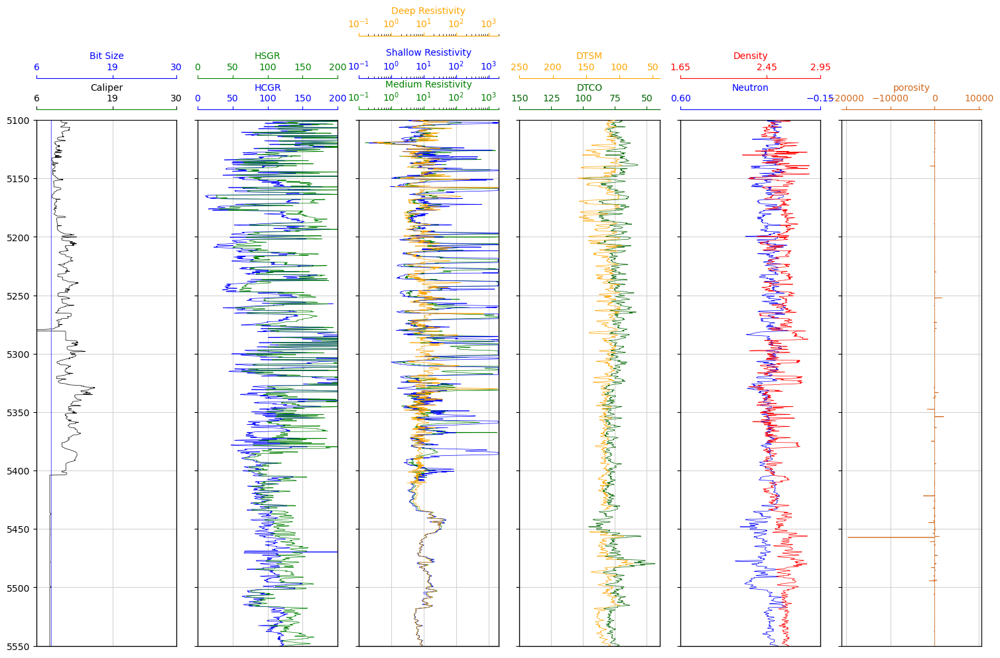

In [24]:
import matplotlib.pyplot as plt

# Create a figure and set of subplots
fig, ax = plt.subplots(figsize=(15,10))

# Set up the plot axes
ax1 = plt.subplot2grid((1,6), (0,0), rowspan=1, colspan=1)
ax2 = plt.subplot2grid((1,6), (0,1), rowspan=1, colspan=1, sharey=ax1)
ax3 = plt.subplot2grid((1,6), (0,2), rowspan=1, colspan=1, sharey=ax1)
ax4 = plt.subplot2grid((1,6), (0,3), rowspan=1, colspan=1, sharey=ax1)
ax5 = plt.subplot2grid((1,6), (0,4), rowspan=1, colspan=1, sharey=ax1)
ax6 = plt.subplot2grid((1,6), (0,5), rowspan=1, colspan=1, sharey=ax1)

# Adding top border back in without dealing with splines
for ax in [ax1, ax2, ax3, ax4, ax5, ax6]:
    twin_ax = ax.twiny()
    twin_ax.xaxis.set_visible(False)

c = ["black", "green", "blue", "red", "yellow", "pink", "chocolate", "lightblue"]

# Combine Caliper and Bit Size track
ax1.plot(well["CALI"], well["DEPTH"], color=c[0], linewidth=0.5)
ax1.set_xlabel("Caliper")
ax1.set_xlim(6, 30)
ax1.xaxis.label.set_color(c[0])        #for label text
ax1.tick_params(axis='x', colors=c[0])   #for scale text
ax1.spines["top"].set_edgecolor(c[1])   #for scale line
ax1.set_xticks([6, 19, 30])

ax1_bs = ax1.twiny()  # Create a second x-axis for the Bit Size track
ax1_bs.plot(well["BS"], well["DEPTH"], color="blue", linewidth=0.5)
ax1_bs.set_xlabel("Bit Size")
ax1_bs.set_xlim(6, 30)
ax1_bs.xaxis.label.set_color("blue")
ax1_bs.tick_params(axis='x', colors="blue")
ax1_bs.spines["top"].set_position(("axes", 1.08))
ax1_bs.spines["top"].set_visible(True)
ax1_bs.spines["top"].set_edgecolor("blue")
ax1_bs.set_xticks([6, 19, 30])

# HCGR track
ax2.plot(well["HCGR"], well["DEPTH"], color="blue", linewidth=0.5)
ax2.set_xlabel("HCGR")
ax2.set_xlim(0, 200)
ax2.xaxis.label.set_color("blue")
ax2.tick_params(axis='x', colors="blue")
ax2.spines["top"].set_edgecolor("blue")
ax2.set_xticks([0, 50, 100, 150, 200])

# Combine HCGR and HSGR track
ax2_hsgr = ax2.twiny()  # Create a second x-axis for the HSGR track
ax2_hsgr.plot(well["HSGR"], well["DEPTH"], color=c[1], linewidth=0.5)
ax2_hsgr.set_xlabel("HSGR")
ax2_hsgr.set_xlim(0, 200)
ax2_hsgr.xaxis.label.set_color(c[1])
ax2_hsgr.tick_params(axis='x', colors=c[1])
ax2_hsgr.spines["top"].set_position(("axes", 1.08))
ax2_hsgr.spines["top"].set_visible(True)
ax2_hsgr.spines["top"].set_edgecolor(c[1])
ax2_hsgr.set_xticks([0, 50, 100, 150, 200])

# Combine MEDRES, SHALORES, and DEPRES track
ax3.plot(well["MEDRES"], well["DEPTH"], color=c[1], linewidth=0.5)
ax3.set_xlabel("Medium Resistivity")
ax3.set_xlim(0.2, 2000)
ax3.xaxis.label.set_color(c[1])
ax3.tick_params(axis='x', colors=c[1])
ax3.spines["top"].set_edgecolor(c[1])
ax3.set_xticks([0.1, 1, 10, 100, 1000])
ax3.semilogx()

ax3_shalores = ax3.twiny()  # Create a second x-axis for SHALORES
ax3_shalores.plot(well["SHALORES"], well["DEPTH"], color=c[2], linewidth=0.5)
ax3_shalores.set_xlabel("Shallow Resistivity")
ax3_shalores.set_xlim(0.2, 2000)
ax3_shalores.xaxis.label.set_color(c[2])
ax3_shalores.tick_params(axis='x', colors=c[2])
ax3_shalores.spines["top"].set_position(("axes", 1.08))
ax3_shalores.spines["top"].set_visible(True)
ax3_shalores.spines["top"].set_edgecolor(c[2])
ax3_shalores.set_xticks([0.1, 1, 10, 100, 1000])
ax3_shalores.semilogx()

ax3_depres = ax3.twiny()  # Create a third x-axis for DEPRES
ax3_depres.plot(well["DEPRES"], well["DEPTH"], color="orange", linewidth=0.5)
ax3_depres.set_xlabel("Deep Resistivity")
ax3_depres.set_xlim(0.2, 2000)
ax3_depres.xaxis.label.set_color("orange")
ax3_depres.tick_params(axis='x', colors="orange")
ax3_depres.spines["top"].set_position(("axes", 1.16))
ax3_depres.spines["top"].set_visible(True)
ax3_depres.spines["top"].set_edgecolor("orange")
ax3_depres.set_xticks([0.1, 1, 10, 100, 1000])
ax3_depres.semilogx()

# Combine DTCO and DTSM track
ax4.plot(well["DTCO"], well["DEPTH"], color='darkgreen', linewidth=0.5)
ax4.set_xlabel("DTCO")
ax4.set_xlim(150,40)
ax4.xaxis.label.set_color('darkgreen')
ax4.tick_params(axis='x', colors='darkgreen')
ax4.spines["top"].set_edgecolor('darkgreen')

ax4_dtsm = ax4.twiny()  # Create a second x-axis for the DTSM track
ax4_dtsm.plot(well["DTSM"], well["DEPTH"], color="orange", linewidth=0.5)
ax4_dtsm.set_xlabel("DTSM")
ax4_dtsm.set_xlim(250,40)
ax4_dtsm.xaxis.label.set_color("orange")
ax4_dtsm.tick_params(axis='x', colors="orange")
ax4_dtsm.spines["top"].set_position(("axes", 1.08))
ax4_dtsm.spines["top"].set_visible(True)
ax4_dtsm.spines["top"].set_edgecolor("orange")

# Combine Neutron and Density track
ax5.plot(well["NEUTRON"], well["DEPTH"], color="blue", linewidth=0.5)
ax5.set_xlabel("Neutron")
ax5.set_xlim(0.6,-0.15)
ax5.xaxis.label.set_color("blue")
ax5.tick_params(axis='x', colors="blue")
ax5.spines["top"].set_edgecolor("blue")
ax5.set_xticks([0.6,-0.15])

ax5_rhoz = ax5.twiny()  # Create a second x-axis for the Density track
ax5_rhoz.plot(well["RHOZ"], well["DEPTH"], color="red", linewidth=0.5)
ax5_rhoz.set_xlabel("Density")
ax5_rhoz.set_xlim(1.65,2.95)
ax5_rhoz.xaxis.label.set_color("red")
ax5_rhoz.tick_params(axis='x', colors="red")
ax5_rhoz.spines["top"].set_position(("axes", 1.08))
ax5_rhoz.spines["top"].set_visible(True)
ax5_rhoz.spines["top"].set_edgecolor("red")
ax5_rhoz.set_xticks([1.65, 2.45, 2.95])

# PEFZ track
ax6.plot(well["Porosity"], well["DEPTH"], color='chocolate', linewidth=0.5)
ax6.set_xlabel("porosity")
# ax6.set_xlim(0, 10)
ax6.xaxis.label.set_color('chocolate')
ax6.tick_params(axis='x', colors='chocolate')
ax6.spines["top"].set_edgecolor('chocolate')
# ax6.set_xticks([0, 2.5, 5, 7.5, 10])

# Set common properties for all axes
for ax in [ax1, ax2, ax3, ax4, ax5, ax6]:
    ax.set_ylim(5550,5100)
    ax.grid(which='major', color='lightgrey', linestyle='-')
    ax.xaxis.set_ticks_position("top")
    ax.xaxis.set_label_position("top")
    ax.spines["top"].set_position(("axes", 1.02))

# Hide y-tick labels for all but the first track
for ax in [ax2, ax3, ax4, ax5, ax6]:
    plt.setp(ax.get_yticklabels(), visible=False)

plt.tight_layout()
fig.subplots_adjust(wspace=0.15)
plt.show()
